In [ ]:
# !pip install np_utils

In [ ]:
# !rm -rf /content/Positive

In [ ]:
# !rm -rf /content/Negative

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from PIL import Image
import os
import numpy as np

In [ ]:
! pip install kaggle

In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d oluwaseunad/concrete-and-pavement-crack-images

100% 319M/319M [00:17<00:00, 19.0MB/s]
100% 319M/319M [00:17<00:00, 19.1MB/s]


In [ ]:
!unzip -q concrete-and-pavement-crack-images.zip

In [ ]:
!ls

concrete-and-pavement-crack-images.zip	kaggle.json  Negative  Positive  sample_data


In [ ]:
neg_path = '/content/Negative'

In [ ]:
pos_path = '/content/Positive'

In [ ]:
#using  Cycle GAN architecture

In [ ]:
# # Discriminator model

# class Block(nn.Module):
#   def __init__(self,in_channels,out_channels,stride):
#     super().__init__()
#     self.conv = nn.Sequential(
#         nn.Conv2d(in_channels,out_channels,4,stride,1,bias=True,padding_mode='reflect'),
#         nn.InstanceNorm2d(out_channels),
#         nn.ReLU(0.2),
#     )

#   def forward(self,x):
#     return self.conv(x)

In [ ]:
# # Discriminator model

# class Discriminator(nn.Module):
#   def __init__(self,in_channels = 3, features =[64,128,256,512]):
#     super().__init__()
#     self.initial= nn.Sequential(
#         nn.Conv2d(in_channels,features[0],kernel_size=4,stride=2,padding=1,padding_mode='reflect'),
#         nn.ReLU(0.2),
#     )
#     layers=[]
#     in_channels=features[0]
#     for feature in features[1:]:
#       layers.append(Block(in_channels,feature,stride=1 if feature == features[-1] else 2))
#       in_channels = feature
#     layers.append(nn.Conv2d(in_channels,1,kernel_size=4,stride=1,padding=1,padding_mode='reflect'))
#     self.model=nn.Sequential(*layers)
#     self.flatten = nn.Flatten()
#     self.dense1 = nn.Linear(900, 256)
#     self.leakyrelu1 = nn.LeakyReLU(0.1)
#     self.dropout = nn.Dropout(0.2)
#     self.dense2 = nn.Linear(256, 1)
#     self.sigmoid = nn.Sigmoid()




#   def forward(self, x):
#       x = self.initial(x)
#       x = self.model(x)
#       x = self.flatten(x)
#       x = self.dense1(x)
#       x = self.leakyrelu1(x)
#       x = self.dropout(x)
#       x = self.dense2(x)
#       x = self.sigmoid(x)
#       return x

In [ ]:
# # Discriminator model test

# x=torch.randn((1,3,256,256))
# model = Discriminator()
# preds=model(x)
# print(model)
# print(preds.shape)
# print(preds)

In [ ]:
# # generator model


# class ConvBlock(nn.Module):
#   def __init__(self,in_channels,out_channels,down=True,use_act=True,**kwargs):
#     super().__init__()
#     self.conv = nn.Sequential(
#         nn.Conv2d(in_channels,out_channels,padding_mode='reflect',**kwargs)
#         if down
#         else nn.ConvTranspose2d(in_channels,out_channels,**kwargs),
#         nn.InstanceNorm2d(out_channels),
#         nn.ReLU(inplace = True) if use_act else nn.Identity()
#     )

#   def forward(self,x):
#     return self.conv(x)

In [ ]:
# # generator model

# class ResidualBlock(nn.Module):
#   def __init__(self,channels):
#     super().__init__()
#     self.block = nn.Sequential(
#         ConvBlock(channels,channels,kernel_size=3,padding=1),
#         ConvBlock(channels,channels,use_act=False, kernel_size=3,padding=1),
#     )

#   def forward(self,x):
#     return x + self.block(x)


In [ ]:
# class Generator(nn.Module):
#   def __init__(self, img_channels, num_features=64, num_residuals=9):
#       super(Generator, self).__init__()
#       self.initial = nn.Sequential(
#           nn.Conv2d(img_channels, num_features, kernel_size=7, stride=1, padding=3, padding_mode='reflect'),
#           nn.ReLU(inplace=True)
#       )

#       self.down_blocks = nn.ModuleList([
#           ConvBlock(num_features, num_features*2, kernel_size=3, stride=2, padding=1),
#           ConvBlock(num_features*2, num_features*4, kernel_size=3, stride=2, padding=1)
#       ])

#       self.residual_blocks = nn.Sequential(*[ResidualBlock(num_features*4) for _ in range(num_residuals)])

#       self.up_blocks = nn.ModuleList([
#           ConvBlock(num_features*4, num_features*2, down=False, kernel_size=3, stride=2, padding=1, output_padding=1),
#           ConvBlock(num_features*2, num_features, down=False, kernel_size=3, stride=2, padding=1, output_padding=1)
#       ])

  #     self.last = nn.Conv2d(num_features, img_channels, kernel_size=7, stride=1, padding=3, padding_mode='reflect')

  # def forward(self, x):
  #     x = self.initial(x)
  #     for layer in self.down_blocks:
  #         x = layer(x)
  #     x = self.residual_blocks(x)
  #     for layer in self.up_blocks:
  #         x = layer(x)
  #     return torch.tanh(self.last(x))


In [ ]:
# img_channels = 3
# img_size = 256
# x=torch.randn((2,img_channels,img_size,img_size))
# gen=Generator(img_channels,9)
# print(gen)
# print(gen(x).shape)

In [ ]:
class Discriminator(nn.Module):
  def __init__(self,img_dim):
    super().__init__()
    self.disc = nn.Sequential(
        nn.Linear(img_dim,64),
        nn.LeakyReLU(0.1),
        nn.Linear(64,128),
        nn.LeakyReLU(0.1),
        nn.Linear(128,1),
        nn.Sigmoid(),

    )
  def forward(self,x):
    return self.disc(x)

In [ ]:
class Generator(nn.Module):
  def __init__(self,z_dim,img_dim):
    super().__init__()
    self.gen = nn.Sequential(
        nn.Linear(z_dim,64),
        nn.LeakyReLU(0.1),
        nn.Linear(64,256),
        nn.LeakyReLU(0.1),
        nn.Linear(256,img_dim),
        nn.Tanh(),
    )

  def forward(self,x):
    return self.gen(x)


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
#Hyperparamaters
lr = 3e-4
z_dim = 64
image_dim = 227*170*1
batch_size = 32
num_epoch = 50

In [ ]:
import shutil

# Source and destination paths
source_folder_positive = "/content/Positive"
destination_folder = "/content/root/positive"

# Move positive folder to root folder
shutil.move(source_folder_positive, destination_folder)



'/content/root/positive'

In [ ]:
disc = Discriminator(image_dim).to(device)
gen = Generator(z_dim,image_dim).to(device)
fixed_noise = torch.rand((batch_size,z_dim)).to(device)

transform  = transforms.Compose(
    [
        # transforms.ToPILImage(),  # Convert tensor to PIL Image
        transforms.Grayscale(num_output_channels=1),  # Convert to single-channel (grayscale)
        transforms.ToTensor(),
        transforms.Normalize((0.0,),(0.5,)),
        transforms.Resize((227, 170))
    ]
)
# Path to your dataset directory
dataset_root = "/content/root"

# Create ImageFolder dataset instance
custom_dataset = ImageFolder(root=dataset_root, transform=transform)
loader = DataLoader(custom_dataset, batch_size=batch_size, shuffle=True)

opt_disc = optim.Adam(disc.parameters(),lr=lr)
opt_gen = optim.Adam(disc.parameters(),lr=lr)
criterion = nn.BCELoss()
writer_fake = SummaryWriter(f"runs/GAN_MNIST/fake")
writer_real = SummaryWriter(f"runs/GAN_MNIST/real")

Epoch [0/50], Batch Step [0/469], Loss D: 0.3534, Loss G: 0.7095


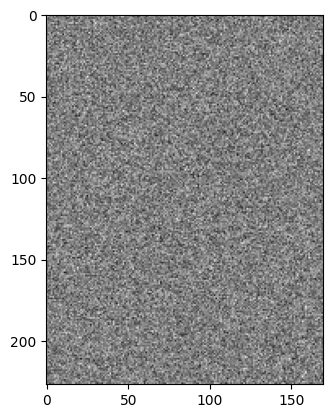

Epoch [1/50], Batch Step [0/469], Loss D: 0.3582, Loss G: 0.7146


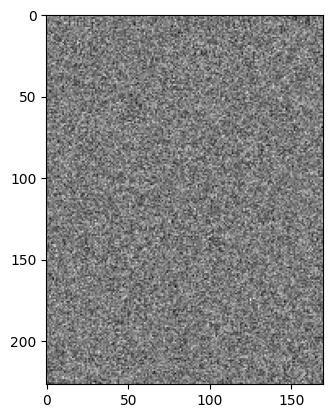

Epoch [2/50], Batch Step [0/469], Loss D: 0.3631, Loss G: 0.7258


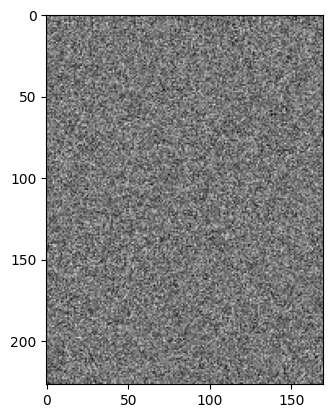

Epoch [3/50], Batch Step [0/469], Loss D: 0.3643, Loss G: 0.7308


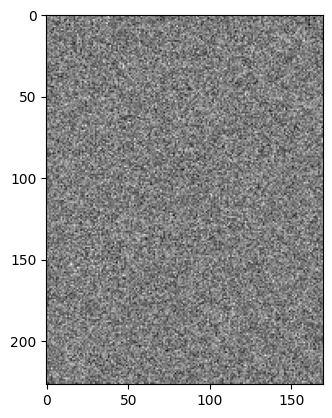

Epoch [4/50], Batch Step [0/469], Loss D: 0.3623, Loss G: 0.7385


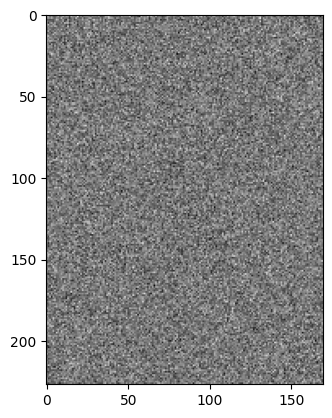

Epoch [5/50], Batch Step [0/469], Loss D: 0.3610, Loss G: 0.7366


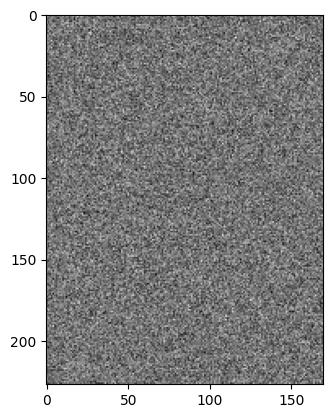

Epoch [6/50], Batch Step [0/469], Loss D: 0.3601, Loss G: 0.7311


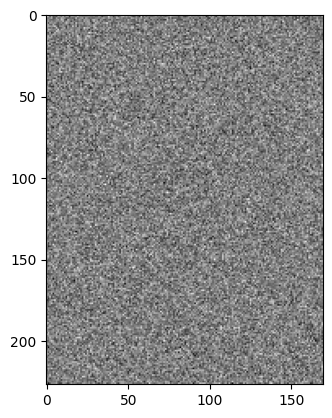

Epoch [7/50], Batch Step [0/469], Loss D: 0.3605, Loss G: 0.7346


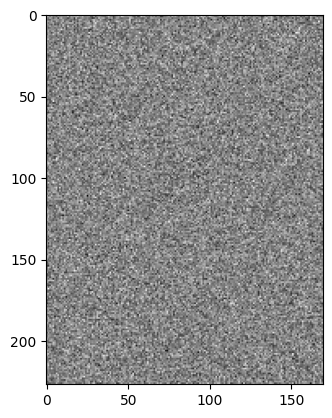

Epoch [8/50], Batch Step [0/469], Loss D: 0.3615, Loss G: 0.7380


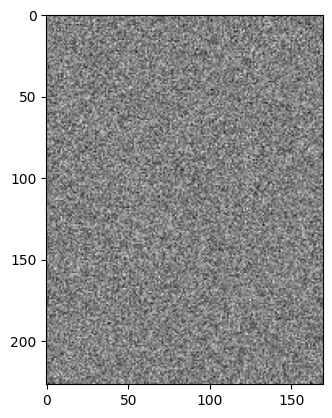

Epoch [9/50], Batch Step [0/469], Loss D: 0.3615, Loss G: 0.7331


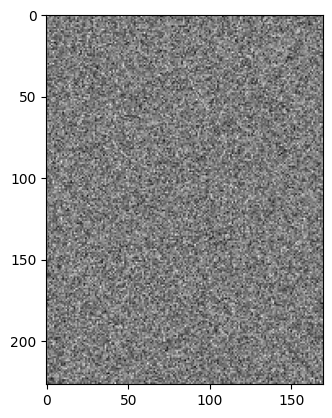

Epoch [10/50], Batch Step [0/469], Loss D: 0.3624, Loss G: 0.7375


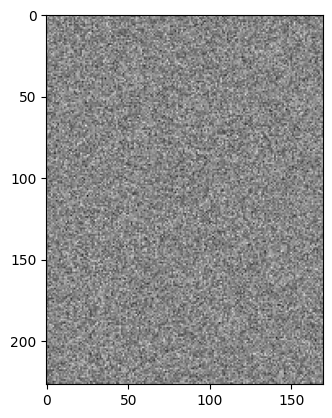

Epoch [11/50], Batch Step [0/469], Loss D: 0.3586, Loss G: 0.7293


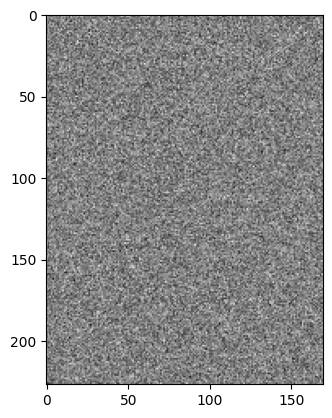

Epoch [12/50], Batch Step [0/469], Loss D: 0.3577, Loss G: 0.7284


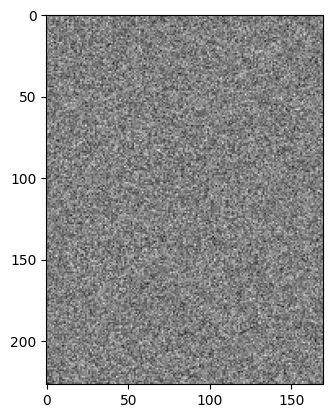

Epoch [13/50], Batch Step [0/469], Loss D: 0.3571, Loss G: 0.7261


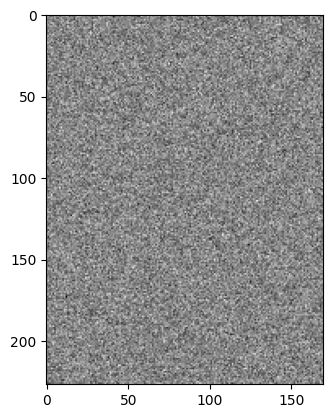

Epoch [14/50], Batch Step [0/469], Loss D: 0.3575, Loss G: 0.7243


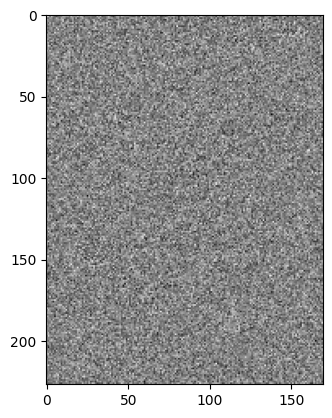

Epoch [15/50], Batch Step [0/469], Loss D: 0.3595, Loss G: 0.7216


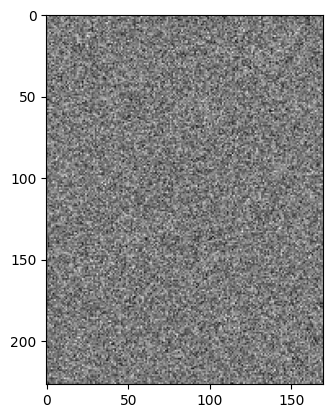

Epoch [16/50], Batch Step [0/469], Loss D: 0.3570, Loss G: 0.7149


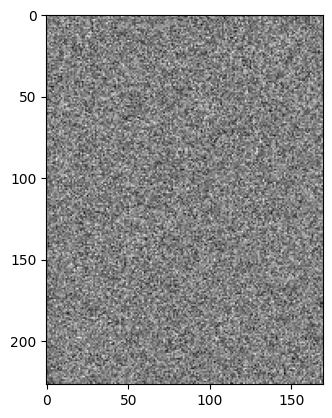

Epoch [17/50], Batch Step [0/469], Loss D: 0.3528, Loss G: 0.7197


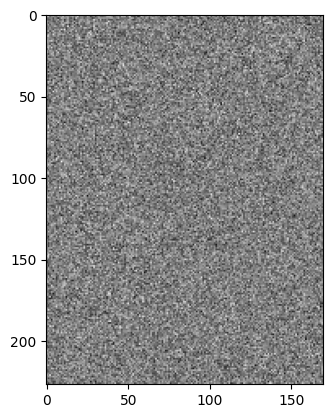

Epoch [18/50], Batch Step [0/469], Loss D: 0.3516, Loss G: 0.7136


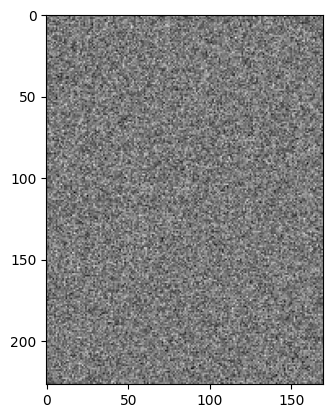

Epoch [19/50], Batch Step [0/469], Loss D: 0.3483, Loss G: 0.7163


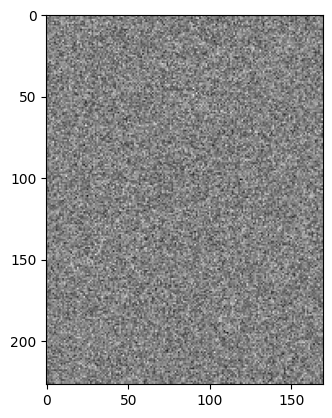

Epoch [20/50], Batch Step [0/469], Loss D: 0.3488, Loss G: 0.7122


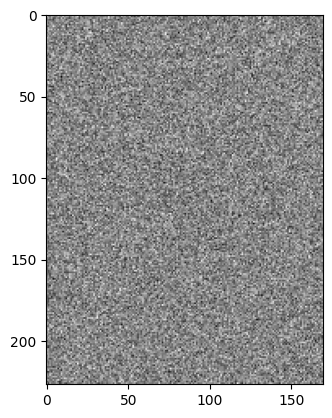

Epoch [21/50], Batch Step [0/469], Loss D: 0.3495, Loss G: 0.7077


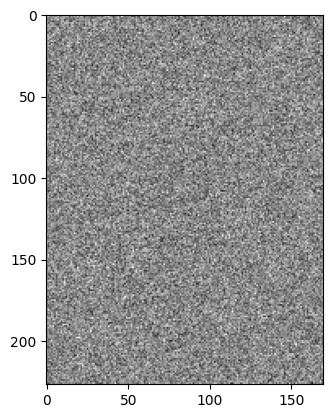

Epoch [22/50], Batch Step [0/469], Loss D: 0.3514, Loss G: 0.7130


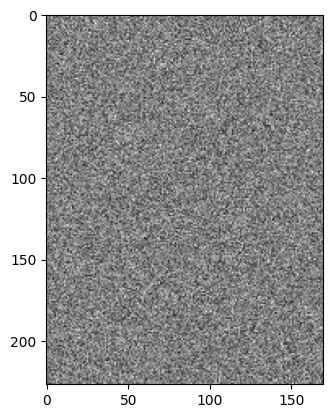

Epoch [23/50], Batch Step [0/469], Loss D: 0.3534, Loss G: 0.6985


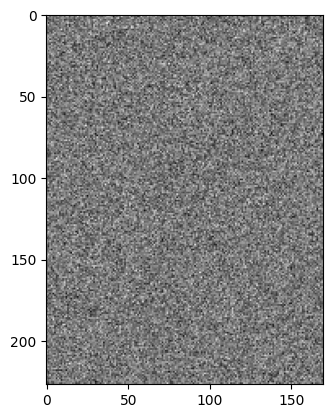

Epoch [24/50], Batch Step [0/469], Loss D: 0.3494, Loss G: 0.7073


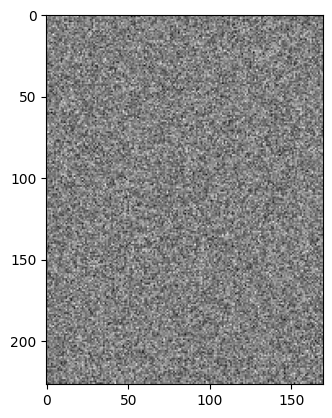

Epoch [25/50], Batch Step [0/469], Loss D: 0.3461, Loss G: 0.7127


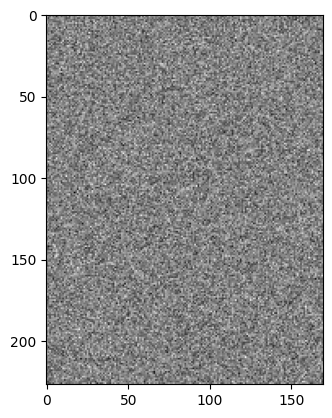

Epoch [26/50], Batch Step [0/469], Loss D: 0.3487, Loss G: 0.7046


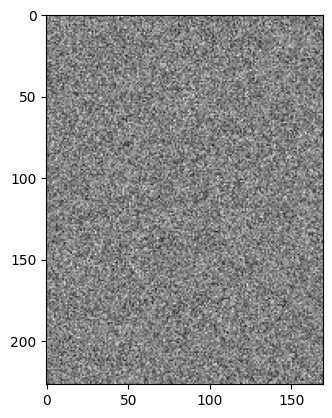

Epoch [27/50], Batch Step [0/469], Loss D: 0.3475, Loss G: 0.7052


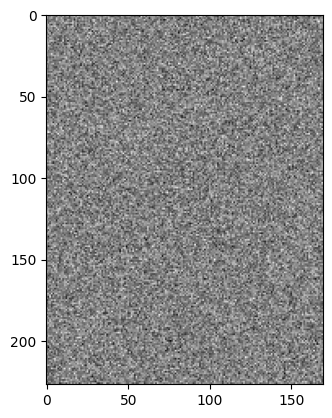

Epoch [28/50], Batch Step [0/469], Loss D: 0.3458, Loss G: 0.7106


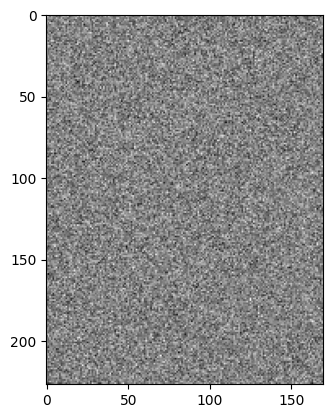

Epoch [29/50], Batch Step [0/469], Loss D: 0.3470, Loss G: 0.7063


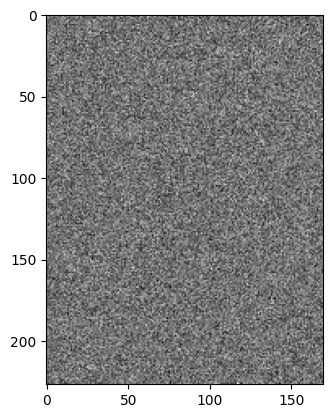

Epoch [30/50], Batch Step [0/469], Loss D: 0.3434, Loss G: 0.7169


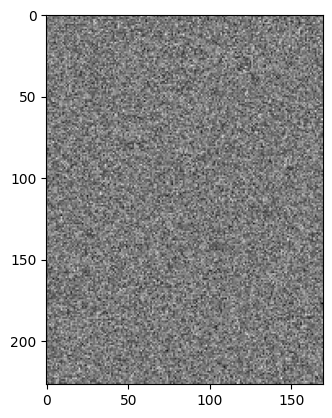

Epoch [31/50], Batch Step [0/469], Loss D: 0.3473, Loss G: 0.7054


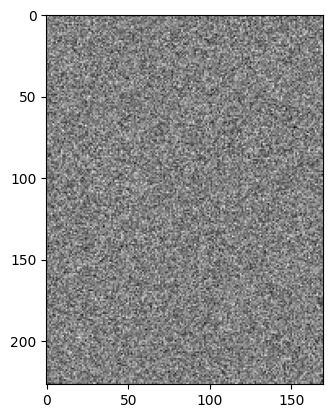

Epoch [32/50], Batch Step [0/469], Loss D: 0.3469, Loss G: 0.7035


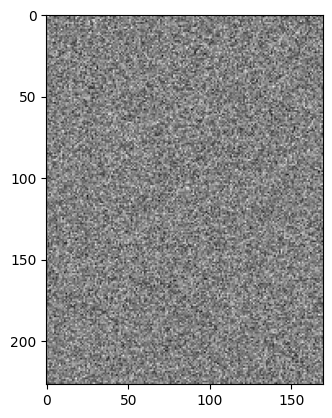

Epoch [33/50], Batch Step [0/469], Loss D: 0.3447, Loss G: 0.7083


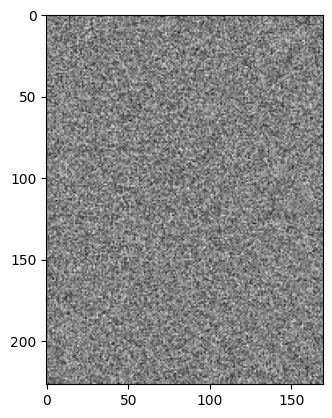

Epoch [34/50], Batch Step [0/469], Loss D: 0.3425, Loss G: 0.7124


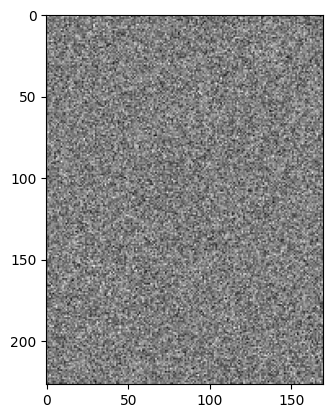

Epoch [35/50], Batch Step [0/469], Loss D: 0.3445, Loss G: 0.7057


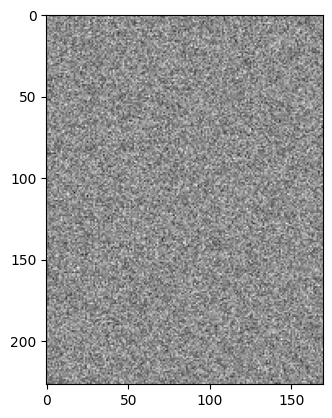

Epoch [36/50], Batch Step [0/469], Loss D: 0.3436, Loss G: 0.7087


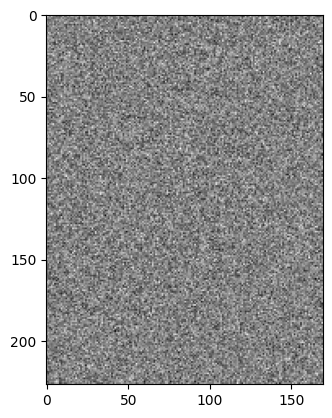

Epoch [37/50], Batch Step [0/469], Loss D: 0.3446, Loss G: 0.7085


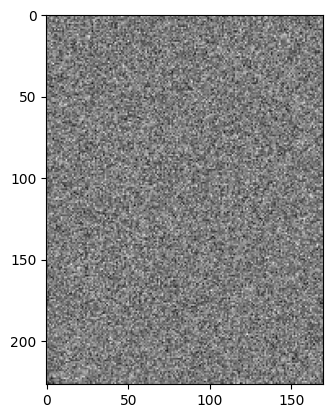

Epoch [38/50], Batch Step [0/469], Loss D: 0.3431, Loss G: 0.7091


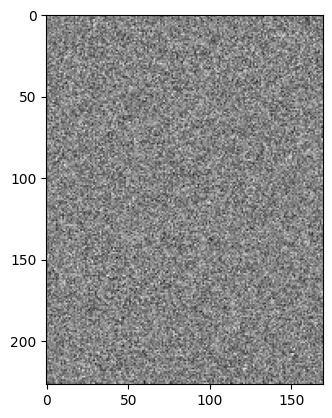

Epoch [39/50], Batch Step [0/469], Loss D: 0.3427, Loss G: 0.7105


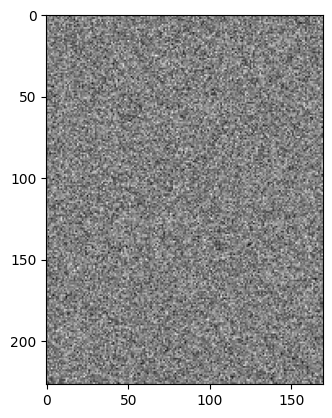

Epoch [40/50], Batch Step [0/469], Loss D: 0.3489, Loss G: 0.7001


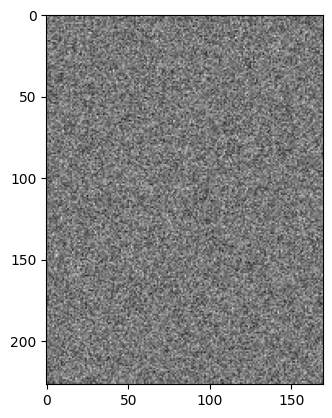

Epoch [41/50], Batch Step [0/469], Loss D: 0.3479, Loss G: 0.6990


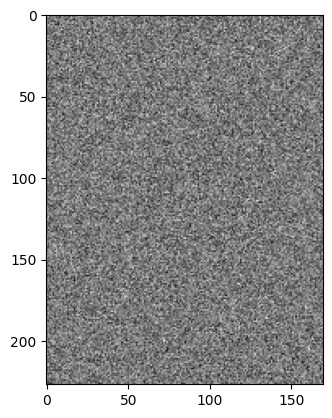

Epoch [42/50], Batch Step [0/469], Loss D: 0.3434, Loss G: 0.7044


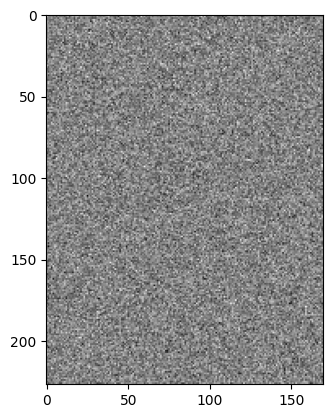

Epoch [43/50], Batch Step [0/469], Loss D: 0.3446, Loss G: 0.7007


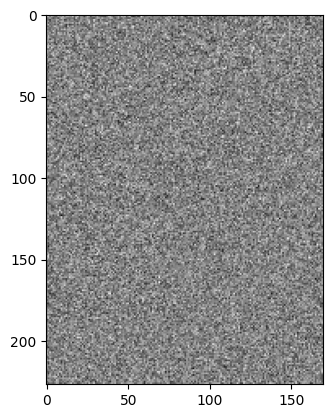

Epoch [44/50], Batch Step [0/469], Loss D: 0.3451, Loss G: 0.6998


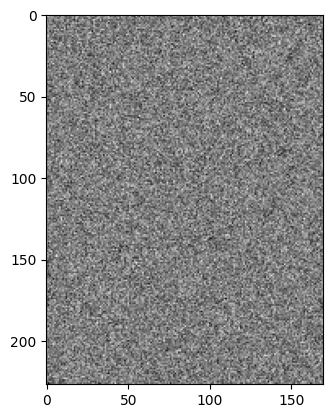

Epoch [45/50], Batch Step [0/469], Loss D: 0.3461, Loss G: 0.6965


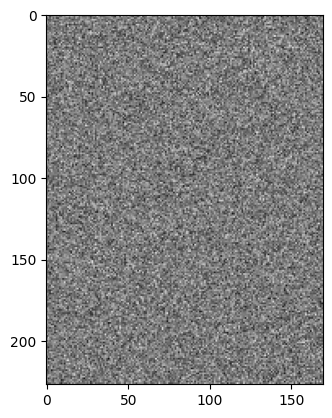

Epoch [46/50], Batch Step [0/469], Loss D: 0.3466, Loss G: 0.6950


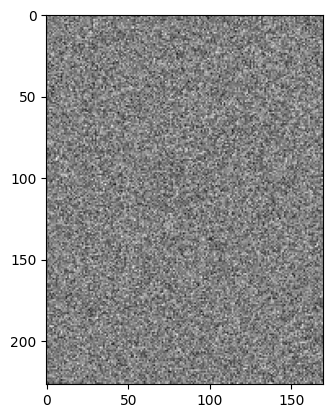

Epoch [47/50], Batch Step [0/469], Loss D: 0.3459, Loss G: 0.6967


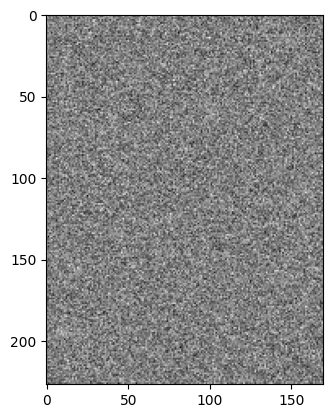

Epoch [48/50], Batch Step [0/469], Loss D: 0.3470, Loss G: 0.6947


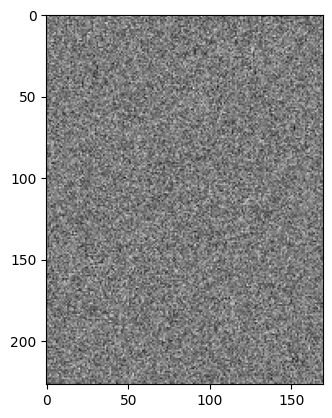

Epoch [49/50], Batch Step [0/469], Loss D: 0.3471, Loss G: 0.6934


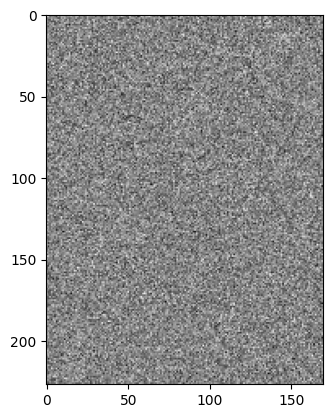

In [ ]:
step = 0
for epoch in range(num_epoch):
  for batch_idx,(real,_) in enumerate(loader):
    # print(real.shape)
    real = real.view(-1,227*170).to(device)
    # print(real.shape)
    batch_size = real.shape[0]

    #Discriminator : max log(D(real)) + log(1-D(G(z)))

    noise = torch.randn(batch_size,z_dim).to(device)
    fake = gen(noise)
    disc_real = disc(real).view(-1)
    lossD_real = criterion(disc_real,torch.ones_like(disc_real))
    disc_fake = disc(fake).view(-1)
    lossD_fake = criterion(disc_fake,torch.zeros_like(disc_fake))
    lossD = (lossD_real + lossD_fake)/2
    disc.zero_grad()
    lossD.backward(retain_graph = True)
    opt_disc.step()

    # Train Generator min log(1-D(G(z)))
    output = disc(fake).view(-1)
    lossG = criterion(output,torch.ones_like(output))
    gen.zero_grad()
    lossG.backward()
    opt_gen.step()

    #Plotting
    if batch_idx % 1000 == 0:
        print(f"Epoch [{epoch}/{num_epoch}], Batch Step [{batch_idx}/{len(loader)}], Loss D: {lossD:.4f}, Loss G: {lossG:.4f}")

        # Plot the generated images
        fig, ax = plt.subplots()
        ax.imshow(fake[0].view(227, 170).cpu().detach().numpy(), cmap='gray')
        plt.show()